In [31]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [10]:
import json
import os
import os.path as osp
import sys
from PIL import Image
import pickle as pkl
import cv2
import numpy as np
#%matplotlib notebook
import matplotlib.pyplot as plt

from detectron.datasets.json_dataset import JsonDataset
from detectron.utils.io import load_object, save_object
from detectron.datasets.roidb import combined_roidb_for_training
import detectron.utils.vis as vis_utils
from detectron.core.config import cfg



def checkMkdir(dirname):
    if not osp.isdir(dirname):
        os.makedirs(dirname)
        
outFolder = '/media/data/chnxi/GOD/json_annotations/'
dateVersion = '201909'

checkMkdir(outFolder)
        
datasetList = ['Object365_val', 'Object365_train'] # ['FashionV2'] # #, 

godLabelFile = '/media/data/chnxi/GOD/taxonomy/GOD_taxonomy_20191016.tsv'

god_label = pd.read_csv(labelFile, delimiter='\t')
god_name_id_map = dict(zip(god_label['GOD_v1_name'], god_label['GOD_v1_id']))

godLabels = [l.rstrip().split('\t') for l in open(godLabelFile,'r').readlines()[1:]]
print (godLabels[:40])

mapFile = '/media/data/chnxi/GOD/mappings/{}/dataset_nameid_to_GOD_nameid/Object365_mapping_to_GOD.pkl'.format(dateVersion)

dataPath = '/media/data/chnxi/Object365/json_annotations/'
jsonFiles = {'Object365_val': dataPath + 'objects365_val.json',
            'Object365_train': dataPath + 'objects365_train.json'
               }

[['1', 'animal/amphibian/frog'], ['2', 'animal/arthropod/arachnid/scorpion'], ['3', 'animal/arthropod/arachnid/spider'], ['4', 'animal/arthropod/crustacean/crab'], ['5', 'animal/arthropod/crustacean/lobster'], ['6', 'animal/arthropod/crustacean/shrimp'], ['7', 'animal/arthropod/insect/ant'], ['8', 'animal/arthropod/insect/bee'], ['9', 'animal/arthropod/insect/beetle'], ['10', 'animal/arthropod/insect/butterfly'], ['11', 'animal/arthropod/insect/caterpillar'], ['12', 'animal/arthropod/insect/dragonfly'], ['13', 'animal/arthropod/insect/ladybug'], ['14', 'animal/arthropod/insect/moths_and_butterflies'], ['15', 'animal/arthropod/insect/tick'], ['16', 'animal/arthropod/isopod'], ['17', 'animal/arthropod/myriapod/centipede'], ['18', 'animal/bird'], ['19', 'animal/bird/blue_jay'], ['20', 'animal/bird/canary'], ['21', 'animal/bird/chicken'], ['22', 'animal/bird/duck'], ['23', 'animal/bird/eagle'], ['24', 'animal/bird/falcon'], ['25', 'animal/bird/goose'], ['26', 'animal/bird/magpie'], ['27', 

In [ ]:
mapping = pkl.load(open(mapFile,'rb'))
mapping.keys()
mapping['name_to_god_name']

## Visualize GT

In [24]:
def visVIBbox(imgFileName, bbox, class_name):
    img = Image.open(imgFileName)
    print (img.size)
    fig, ax = plt.subplots(figsize=(6, 6))
    plt.axis('off')
    ax.imshow(img)
    left = bbox[0]
    top = bbox[1]
    width = bbox[2] #-bbox[0]
    height = bbox[3] #-bbox[1]
    #class_name = anno_img['annotation-tags'] #['tag']
    ax.add_patch(
        plt.Rectangle((left, top),
                      width,
                      height, fill=False,
                      edgecolor='g', linewidth=3.5)
        )
    ax.text(left, top - 2,
            '{:s}'.format(class_name),
            bbox=dict(facecolor='blue', alpha=0.5),
            fontsize=14, color='white')
#     plt.draw()
#     plt.show()

In [3]:
dataset = 'Object365_val'

annoFile = jsonFiles[dataset]
annoData = json.load(open(annoFile,'r'))

In [33]:
cats = annoData['categories']
cats

[{'id': 164, 'name': 'cutting/chopping board'},
 {'id': 49, 'name': 'tie'},
 {'id': 306, 'name': 'crosswalk sign'},
 {'id': 145, 'name': 'gun'},
 {'id': 14, 'name': 'street lights'},
 {'id': 223, 'name': 'bar soap'},
 {'id': 74, 'name': 'wild bird'},
 {'id': 219, 'name': 'ice cream'},
 {'id': 37, 'name': 'stool'},
 {'id': 25, 'name': 'storage box'},
 {'id': 153, 'name': 'giraffe'},
 {'id': 52, 'name': 'pen/pencil'},
 {'id': 61, 'name': 'high heels'},
 {'id': 340, 'name': 'mangosteen'},
 {'id': 22, 'name': 'bracelet'},
 {'id': 155, 'name': 'piano'},
 {'id': 162, 'name': 'vent'},
 {'id': 75, 'name': 'laptop'},
 {'id': 236, 'name': 'toaster'},
 {'id': 231, 'name': 'fire truck'},
 {'id': 42, 'name': 'basket'},
 {'id': 150, 'name': 'zebra'},
 {'id': 124, 'name': 'head phone'},
 {'id': 90, 'name': 'sheep'},
 {'id': 322, 'name': 'steak'},
 {'id': 39, 'name': 'couch'},
 {'id': 209, 'name': 'toothbrush'},
 {'id': 59, 'name': 'bicycle'},
 {'id': 336, 'name': 'red cabbage'},
 {'id': 228, 'name': 

{'id': 186193, 'category_id': 4, 'bbox': [449.1058349778, 291.2241821448, 35.33300777160002, 20.05383301439997], 'image_id': 517044, 'iscrowd': 0, 'area': 708.5622377481633}
/media/data/chnxi/Object365/val/obj365_val_000000517044.jpg:[449.1058349778, 291.2241821448, 484.4388427494, 311.2780151592], hat
(658, 492)


<IPython.core.display.Javascript object>


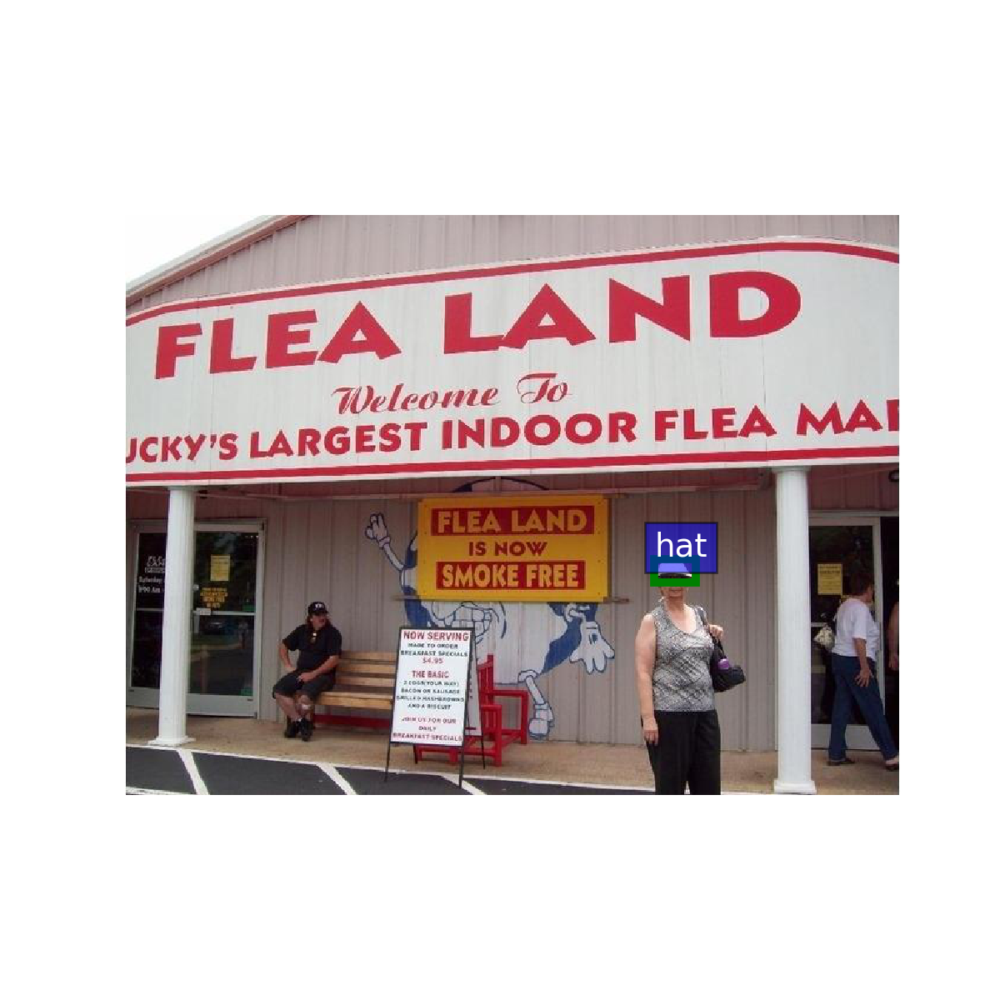

{'id': 358000, 'category_id': 98, 'bbox': [181.0346679808, 540.929931648, 117.65612789760002, 68.92993159679997], 'image_id': 14192, 'iscrowd': 0, 'area': 8110.028847925918}
/media/data/chnxi/Object365/val/obj365_val_000000014192.jpg:[181.0346679808, 540.929931648, 298.6907958784, 609.8598632448], dog
(512, 768)


<IPython.core.display.Javascript object>


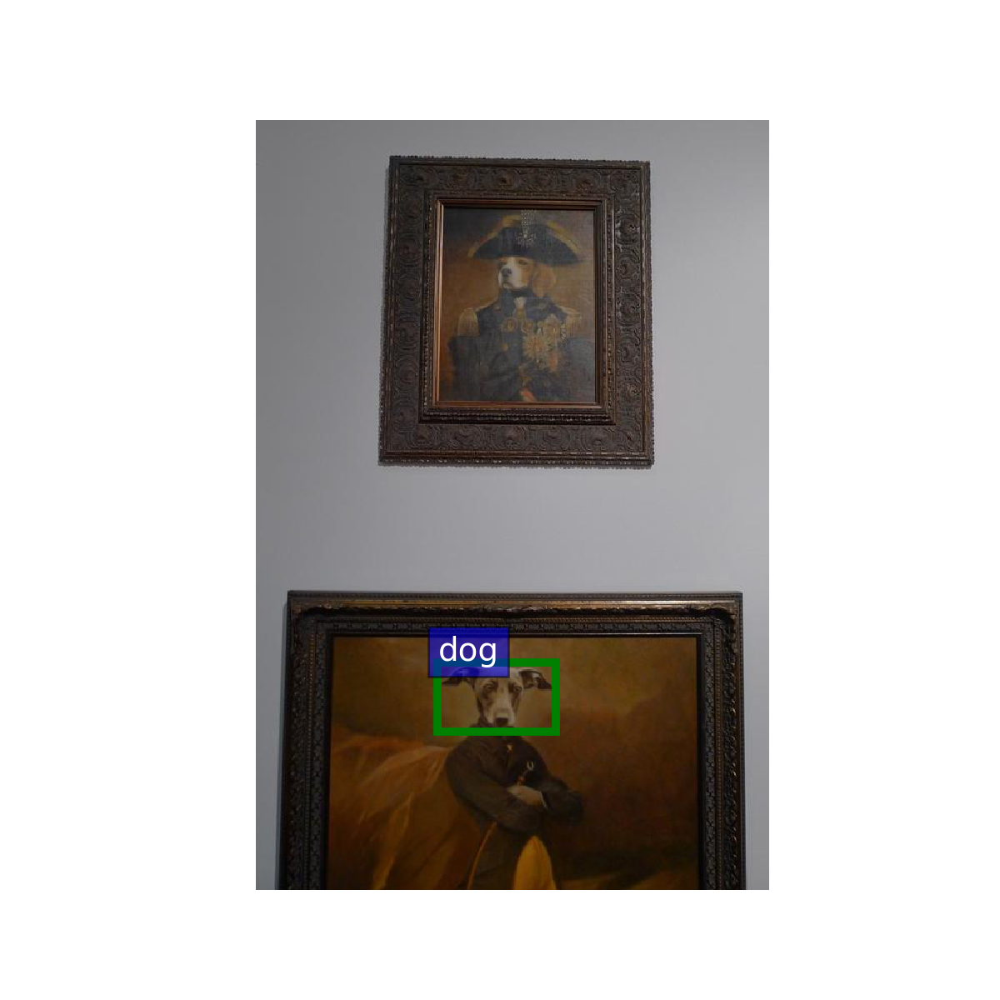

{'id': 449304, 'category_id': 18, 'bbox': [275.7308959744, 224.0227051024, 14.736511231999998, 9.448364241499974], 'image_id': 229991, 'iscrowd': 1, 'area': 139.2359257688915}
/media/data/chnxi/Object365/val/obj365_val_000000229991.jpg:[275.7308959744, 224.0227051024, 290.4674072064, 233.47106934389998], leather shoes
(512, 551)


<IPython.core.display.Javascript object>


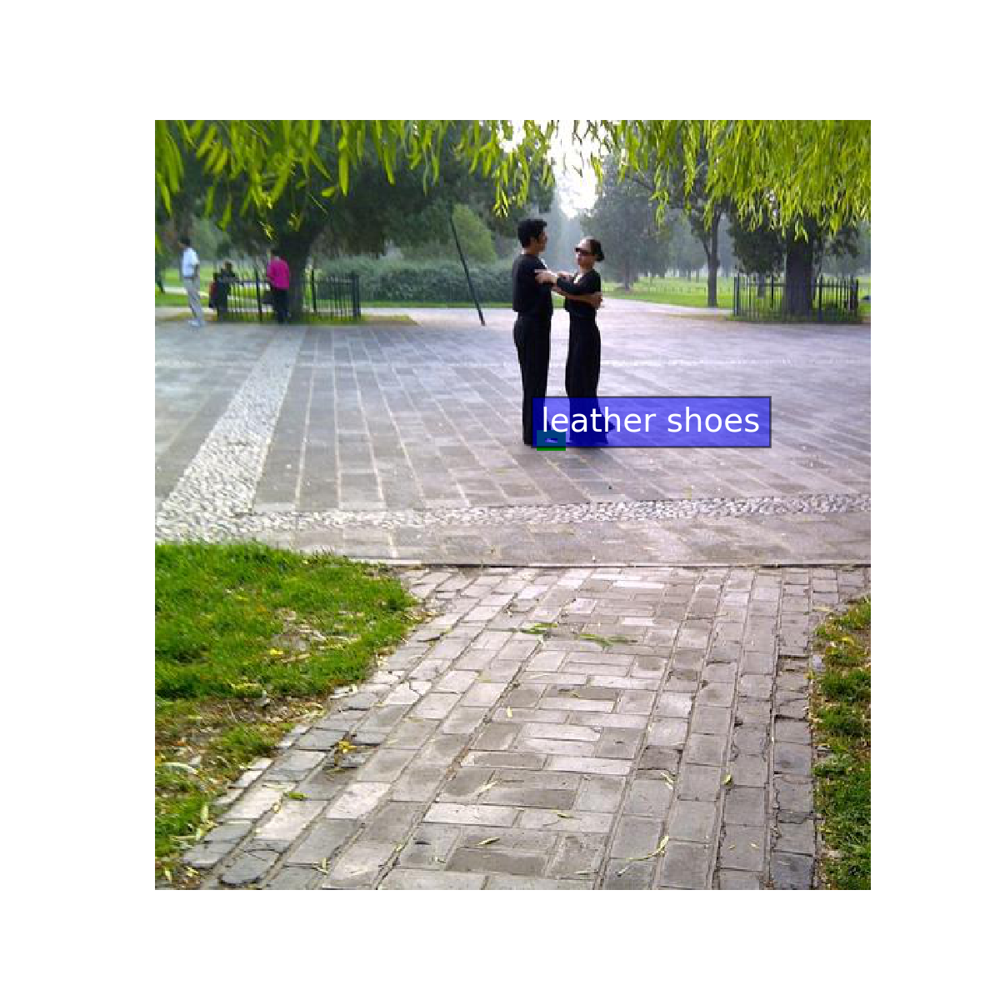

{'id': 121916, 'category_id': 1, 'bbox': [0.2009888, 67.8836670008, 29.957885696, 40.206603978000004], 'image_id': 585536, 'iscrowd': 0, 'area': 1204.504846197263}
/media/data/chnxi/Object365/val/obj365_val_000000585536.jpg:[0.2009888, 67.8836670008, 30.158874496000003, 108.0902709788], person
(640, 428)


<IPython.core.display.Javascript object>


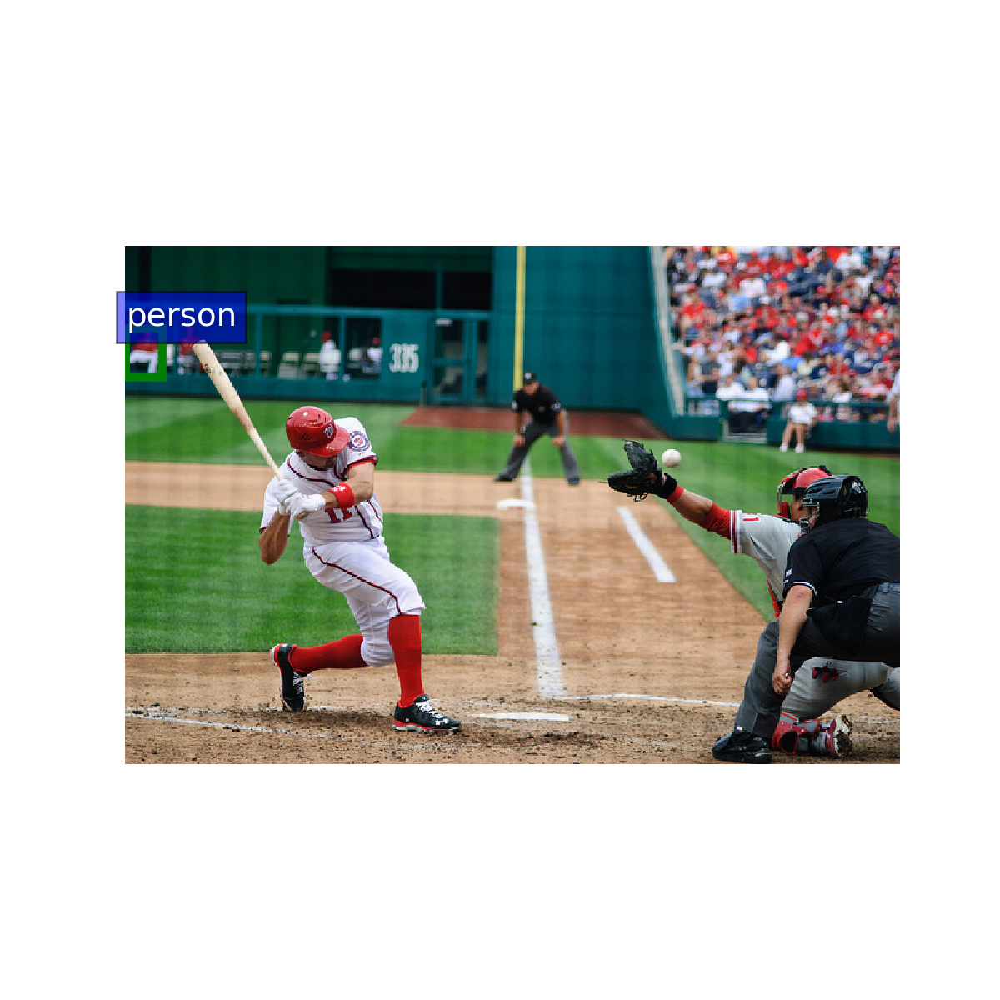

{'id': 414355, 'category_id': 85, 'bbox': [193.612060512, 447.9036865024, 78.86303717759998, 43.161560064000014], 'image_id': 454769, 'iscrowd': 0, 'area': 3403.8517159704475}
/media/data/chnxi/Object365/val/obj365_val_000000454769.jpg:[193.612060512, 447.9036865024, 272.4750976896, 491.0652465664], fork
(832, 512)


<IPython.core.display.Javascript object>


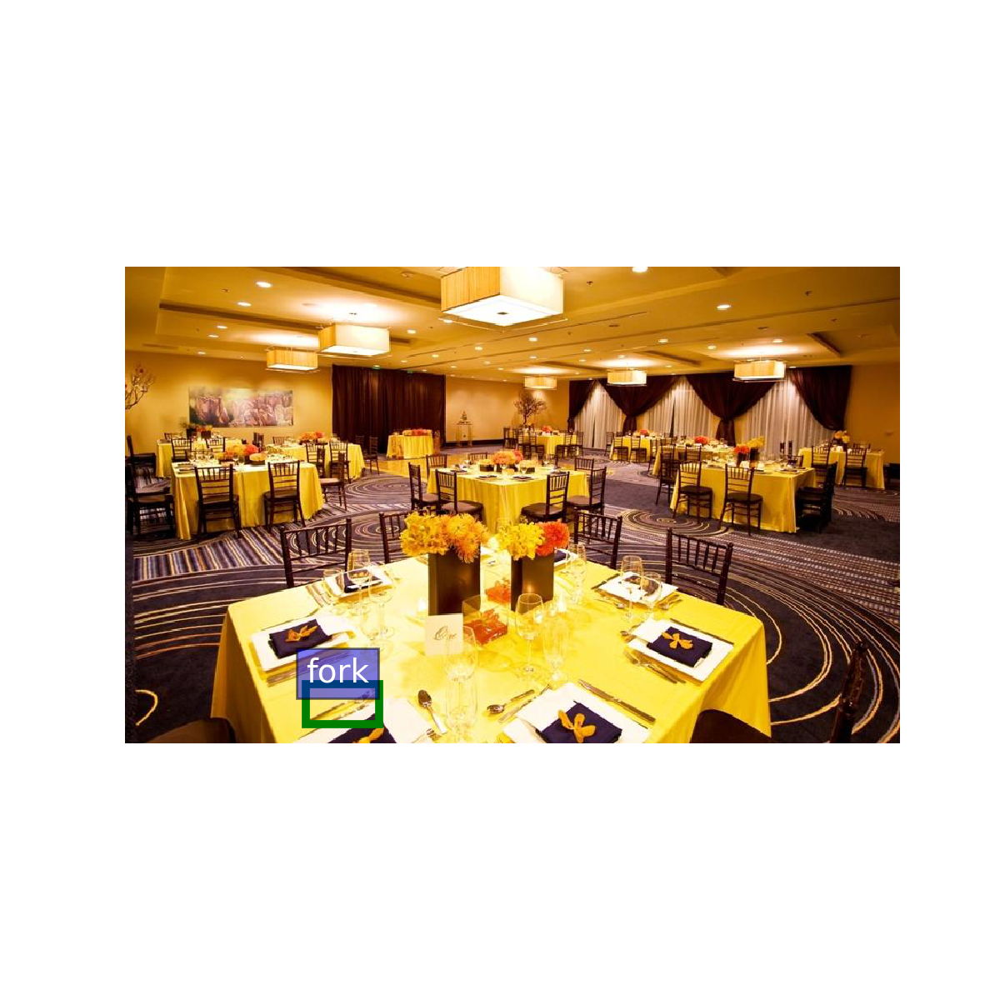

{'id': 307259, 'category_id': 22, 'bbox': [216.8270874112, 372.7426758124, 25.724243148799985, 33.51953123749996], 'image_id': 735081, 'iscrowd': 0, 'area': 862.2645717872455}
/media/data/chnxi/Object365/val/obj365_val_000000735081.jpg:[216.8270874112, 372.7426758124, 242.55133056, 406.2622070499], bracelet
(512, 683)


<IPython.core.display.Javascript object>


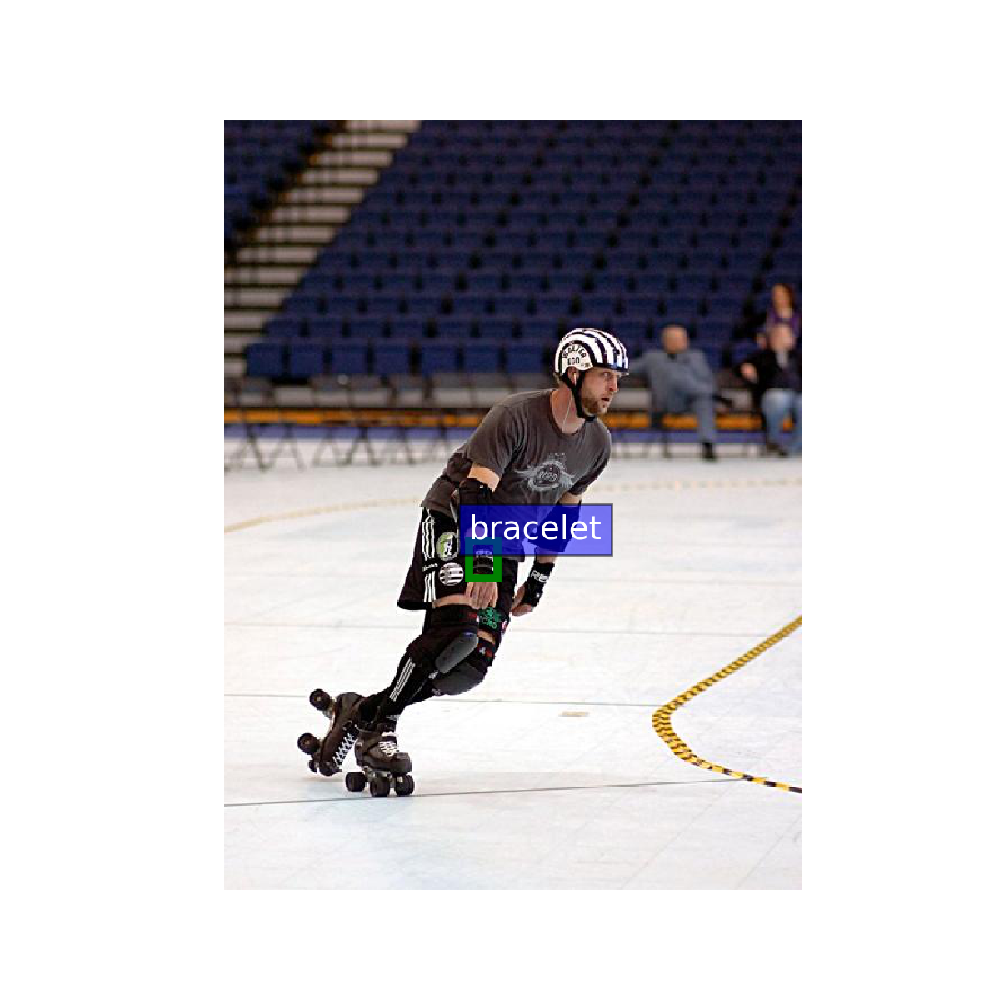

{'id': 17664, 'category_id': 51, 'bbox': [340.6934814153, 493.676147456, 9.815185560700002, 16.61029053439995], 'image_id': 456363, 'iscrowd': 0, 'area': 163.0330838122743}
/media/data/chnxi/Object365/val/obj365_val_000000456363.jpg:[340.6934814153, 493.676147456, 350.50866697600003, 510.2864379904], traffic light
(767, 512)


<IPython.core.display.Javascript object>


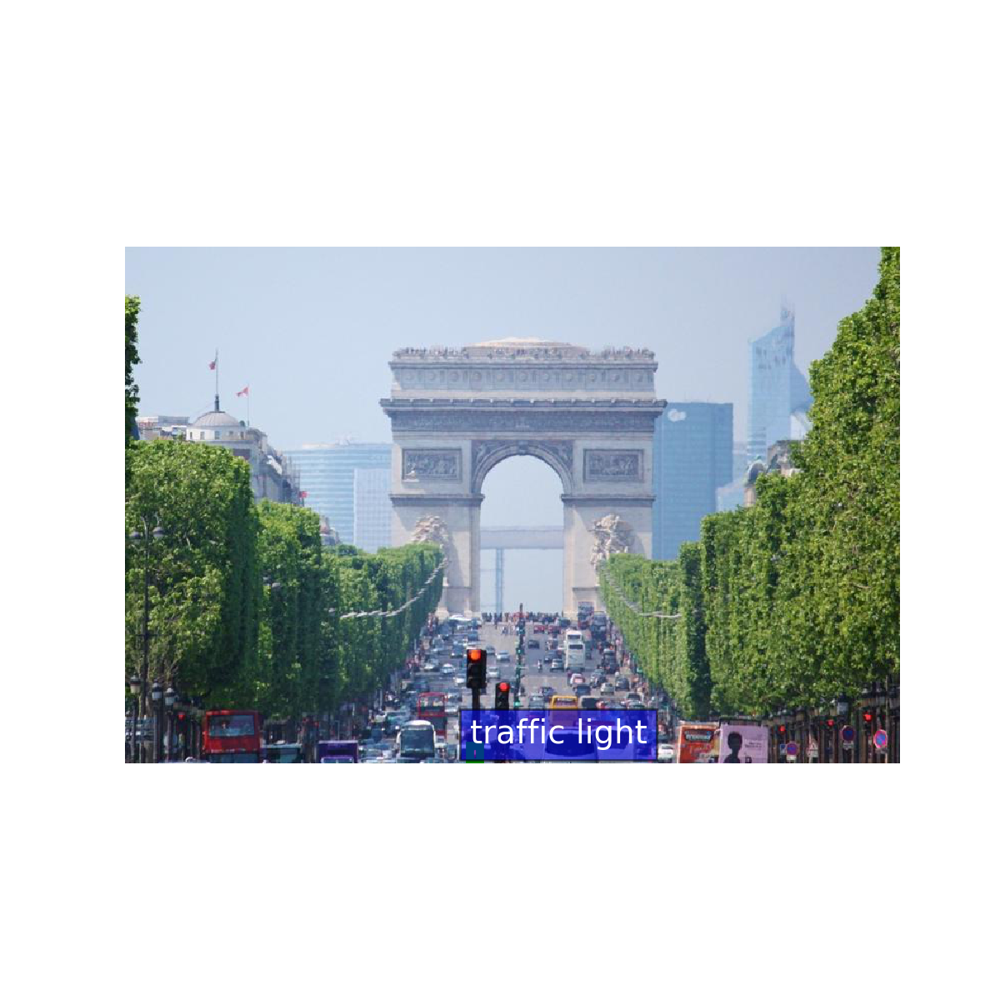

{'id': 476861, 'category_id': 20, 'bbox': [426.497436544, 225.87475584, 42.49096678400002, 43.46166993599999], 'image_id': 598285, 'iscrowd': 0, 'area': 1846.7283736277482}
/media/data/chnxi/Object365/val/obj365_val_000000598285.jpg:[426.497436544, 225.87475584, 468.988403328, 269.336425776], glove
(640, 480)


<IPython.core.display.Javascript object>


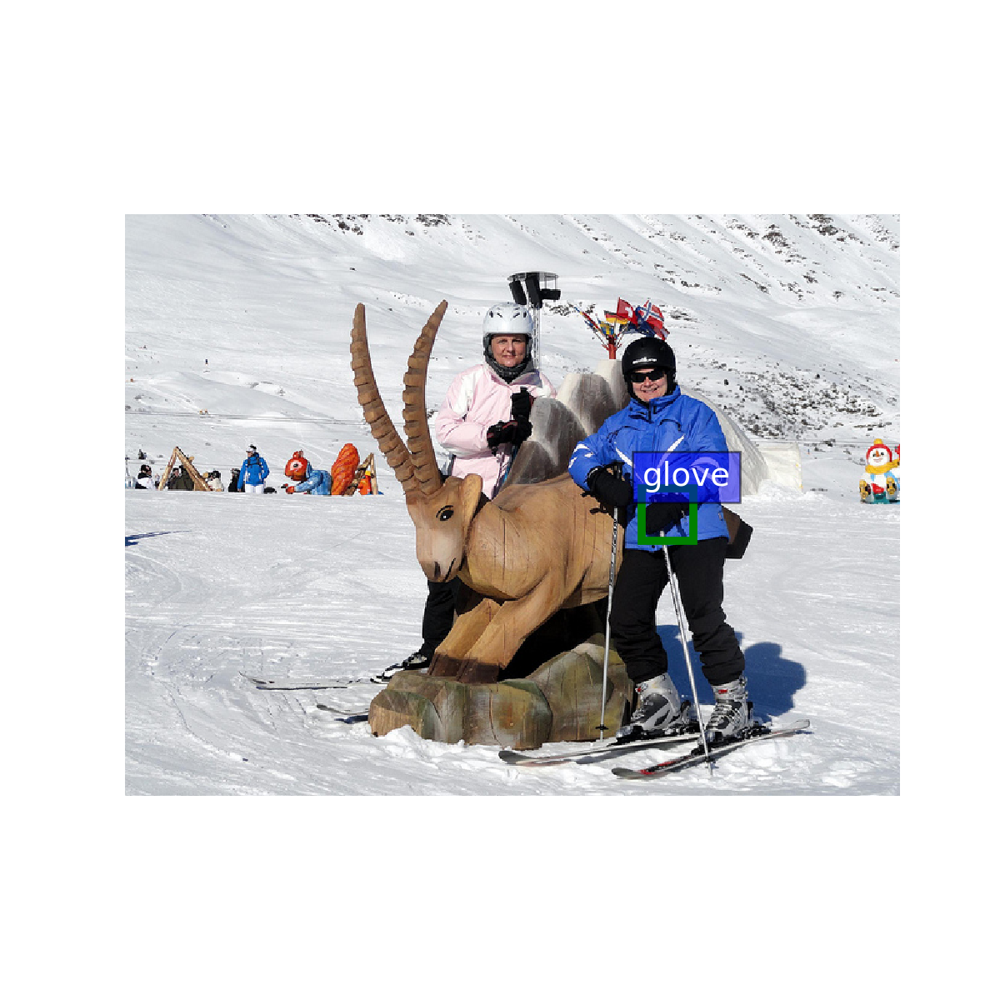

{'id': 101522, 'category_id': 1, 'bbox': [491.65698242699995, 187.0691528192, 47.00964352500006, 91.3782959104], 'image_id': 280223, 'iscrowd': 0, 'area': 4295.661116669875}
/media/data/chnxi/Object365/val/obj365_val_000000280223.jpg:[491.65698242699995, 187.0691528192, 538.666625952, 278.4474487296], person
(683, 512)


<IPython.core.display.Javascript object>


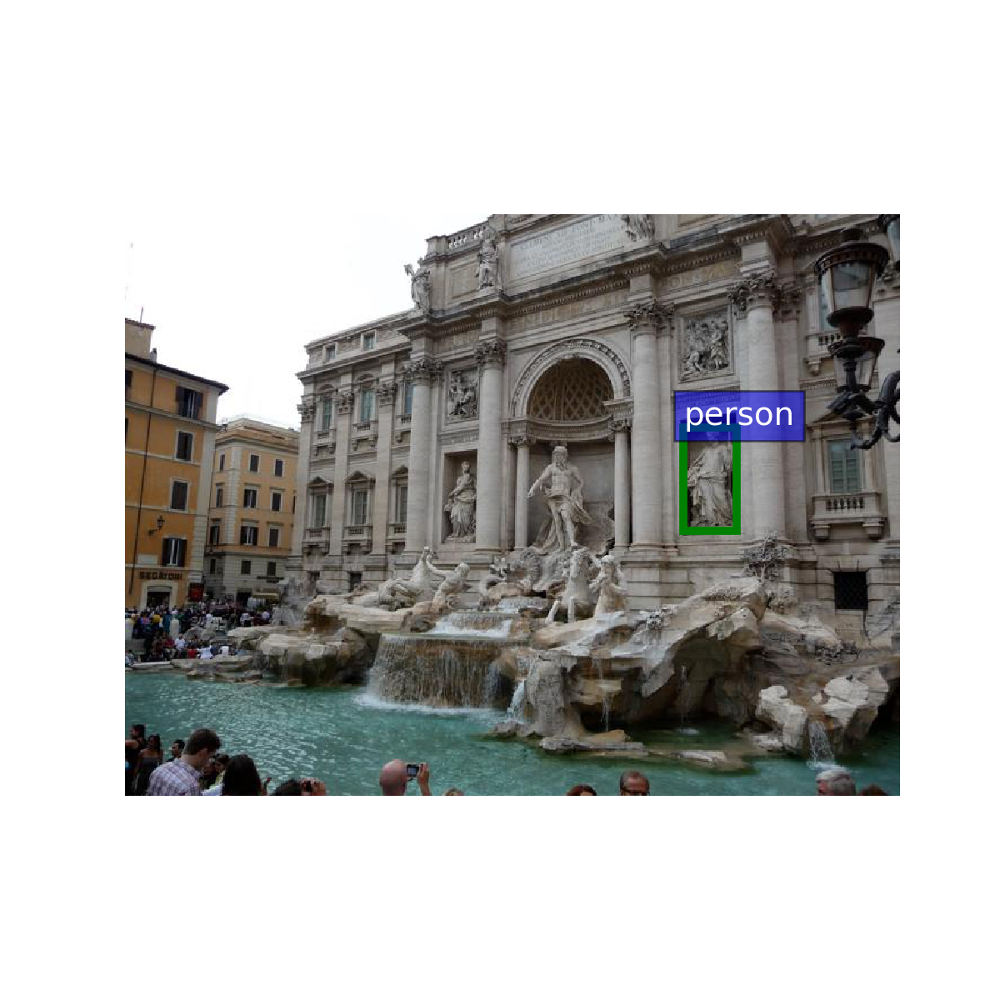

{'id': 445893, 'category_id': 69, 'bbox': [190.1470947497, 313.4885864448, 49.760009736499995, 69.44921871360003], 'image_id': 41341, 'iscrowd': 0, 'area': 3455.793799381055}
/media/data/chnxi/Object365/val/obj365_val_000000041341.jpg:[190.1470947497, 313.4885864448, 239.90710448619998, 382.9378051584], camera
(683, 512)


<IPython.core.display.Javascript object>


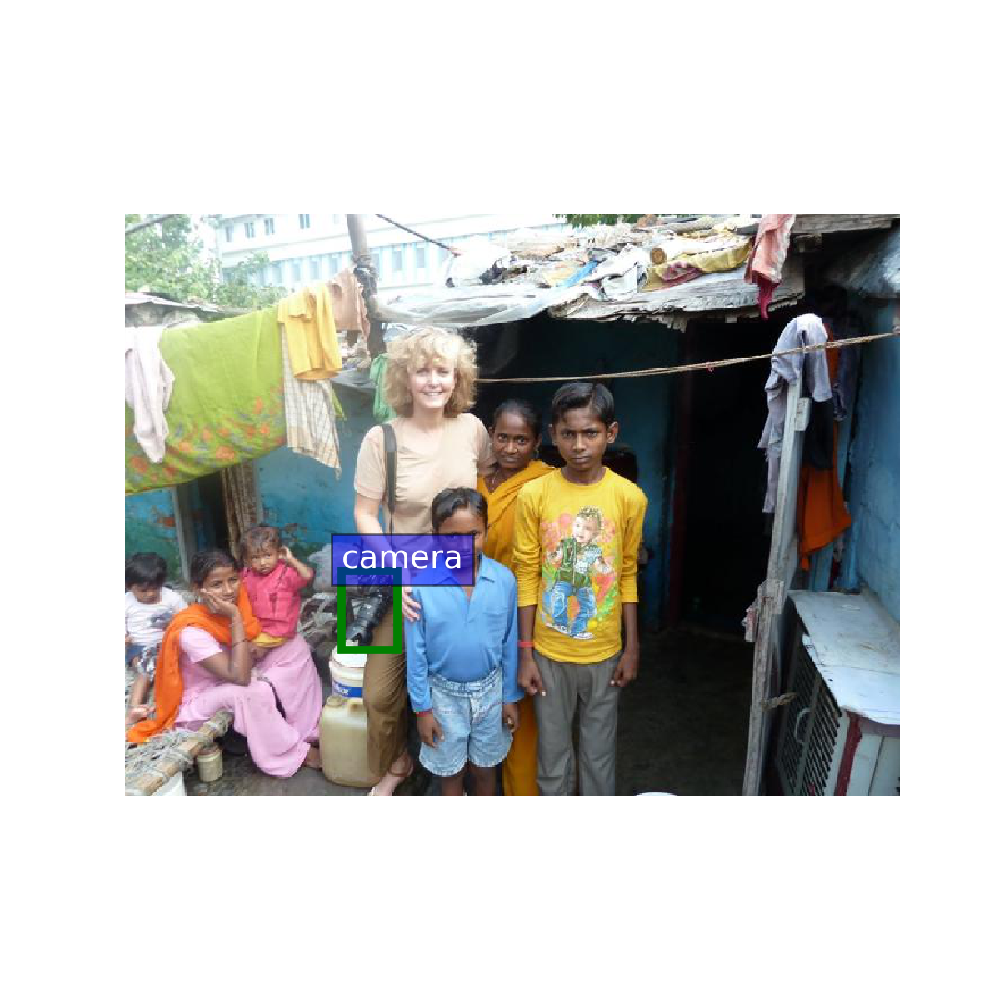

In [30]:
sampleSize = 10
imgFolder = '/media/data/chnxi/Object365/val'
anno = annoData['annotations']
categs = annoData['categories']
categ_id_name_map = {c['id']:c['name'] for c in categs}
#print (categ_id_name_map)
imgIds = [img['id'] for img in annoData['images']]
annoNum = len(anno)
sampleInds = np.random.choice(annoNum, sampleSize)
#plt.cla()
#plt.axis('off')
for anno_id in sampleInds:
    an = anno[anno_id]
    print (an)
    imgId = imgIds.index(an['image_id'])
    imgFileName = osp.join(imgFolder, annoData['images'][imgId]['file_name'])
#     print (imgFileName)
    bbox = an['bbox']
    class_name = categ_id_name_map[an['category_id']]
    l = bbox[0]
    t = bbox[1]
    r = bbox[0] + bbox[2]
    b = bbox[1] + bbox[3]
    print ("{}:{}, {}".format(imgFileName, [l,t,r,b], class_name))
    visVIBbox(imgFileName, bbox, class_name)
    #plt.close()

## Generate GOD Object365 dataset

In [ ]:
updateAnno = True
for dataset in datasetList:
    print ("dataset = {}".format(dataset))
    outFileName = osp.join(outFolder, 'GOD_{}_annotations.json'.format(dataset))
    print ("outFileName = {}".format(outFileName))
    
    #print (mapping.keys())
    id_map = mapping['id_map']
    name_map = mapping['name_to_god_name']
    
    annoFile = jsonFiles[dataset]
    annoData = json.load(open(annoFile,'r'))
    #print (anno.keys())
    
    
    godCateg = []
    supercat = 'GOD_{}'.format(dataset)
    for god_categ in godLabels:
        cls = god_categ[1]
        id = int(god_categ[0])
        cats = {'supercategory':supercat,
                'id':id,
                'name':cls}
        godCateg.append(cats) 
        
        
    subsetCateg = []
    for org_cat in annoData['categories']:
        org_id = org_cat['id']
        if org_id in id_map:
            god_id = id_map[org_id]
            org_name = org_cat['name']
            if dataset == 'OpenImage':
                org_name = org_name.lower().replace('_',' ')
            cats = {'supercategory':supercat,
                    'id':god_id,
                    'name':name_map[org_name]}
            subsetCateg.append(cats)
    
    
    
    #################################################################################
#     for ix, categ in enumerate(annoData['categories']):
#         src_id = categ['id']
#         if src_id in id_map:
#             categ['id'] = id_map[src_id]
# #             print ("{}==>{}".format(src_id, id_map[src_id]))
# #             print (categ)
#             newCateg.append(categ)
#         else:
#             print ("{} not in GOD".format(categ['name']))
    #################################################################################
    
    print(godCateg[:10])
    print (subsetCateg[:10])
    annoData['categories'] = godCateg
    annoData['subset_categories'] = subsetCateg
    
    #################################################################################
    if osp.exists(outFileName) and not updateAnno:
        godAnnoData = json.load(open(outFileName,'r'))
        annoData['annotations'] = godAnnoData['annotations']
    else: # if not exists(outFileName) or  updateAnno
        newAnnos = []
        for ox, obj in enumerate(annoData['annotations']):
            if obj['category_id'] in id_map:
                src_id = obj['category_id']
                god_id = id_map[obj['category_id']]
                obj['category_id'] = god_id
                obj['segmentation'] = []
                newAnnos.append(obj)
                if (ox + 1) % 10000 == 0:
                    print ("{}==>{}".format(src_id, god_id))
    #                 print (obj)
        annoData['annotations'] = newAnnos
    print ("saving to {}".format(outFileName))
    with open(outFileName,'w') as fout:
        json.dump(annoData, fout)
    print ("Done")
    

In [ ]:
print (mapping['name_to_god_name'])